### Installing Tensorflow 2.0.0

In [1]:
pip install tensorflow==2.0.0

In [2]:
import tensorflow as tf
print(tf.__version__)

2.0.0


### Importing all Packages.


In [3]:
# import the necessary packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import pickle
import os 
import random
import time
import cv2
import itertools

from imutils import paths
from tqdm import tqdm_notebook as tqdm

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,Activation, MaxPooling2D,Dense,Dropout,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array
SEED=42


from tensorflow.keras.models import load_model
import numpy as np
import argparse
import imutils
import cv2
import matplotlib.pyplot as plt
%matplotlib inline


from tensorflow.keras.models import load_model
import pickle
import cv2

### Drive Mounting.

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
os.getcwd()

'/content'

In [6]:
os.chdir('/content/drive/MyDrive/DeepL/CNN EXAM DP/Datasets /CNN/Shoe Classification')

In [7]:
!dir

flagged  test  train


In [8]:
list(paths.list_images('train'))[:20]

['train/Sandals/sandals (2).jpg',
 'train/Sandals/sandals (1).jpg',
 'train/Sandals/sandals (3).jpg',
 'train/Sandals/sandals (7).jpg',
 'train/Sandals/sandals (5).jpg',
 'train/Sandals/sandals (6).jpg',
 'train/Sandals/sandals (8).jpg',
 'train/Sandals/sandals (4).jpg',
 'train/Sandals/sandals (9).jpg',
 'train/Sandals/sandals (10).jpg',
 'train/Sandals/sandals (11).jpg',
 'train/Sandals/sandals (13).jpg',
 'train/Sandals/sandals (12).jpg',
 'train/Sandals/sandals (14).jpg',
 'train/Sandals/sandals (15).jpg',
 'train/Sandals/sandals (21).jpg',
 'train/Sandals/sandals (18).jpg',
 'train/Sandals/sandals (20).jpg',
 'train/Sandals/sandals (22).jpg',
 'train/Sandals/sandals (17).jpg']

In [9]:
# initialize the data and labels

labels=[]
data=[]
imagepaths=list(paths.list_images('train'))
time1=time.time()

random.seed(SEED)
random.shuffle(imagepaths)

with tqdm(total=len(imagepaths)) as pbar:
    for imagepath in imagepaths:
        image=cv2.imread(imagepath)
        image=cv2.resize(image,(32,32))
        image=img_to_array(image)
        data.append(image)
        
        label=imagepath.split(os.path.sep)[-2]

        if label =='Boots':
            label=0
        elif label=='Sandals':
            label=1
        elif label=='Slippers':
            label=2
        
        labels.append(label)
        pbar.update(1)
print("--------loading images.................",time.time()-time1)

  0%|          | 0/778 [00:00<?, ?it/s]

--------loading images................. 2.9652626514434814


In [10]:
data[0].shape

(32, 32, 3)

In [11]:
labels[0]

2

# Model Buildings 

0


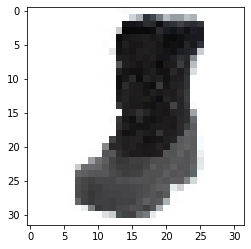

In [12]:
plt.imshow(data[6].astype(int))
print(labels[6])
plt.show()

In [13]:
data1=np.array(data,dtype='float')/255.0
labels = np.array(labels)

In [14]:
x_train, x_test,y_train,y_test=train_test_split(data1,labels, test_size=0.20,random_state=SEED)
print("x_train shape is:",x_train.shape)
print("y_train shape is:",y_train.shape)
print("x_test shape is:",x_test.shape)
print("y_test shape is:",y_test.shape)

x_train shape is: (622, 32, 32, 3)
y_train shape is: (622,)
x_test shape is: (156, 32, 32, 3)
y_test shape is: (156,)


In [15]:
print("[Info] Compiling.............")
model=Sequential()

## first set of CONV => RELU => POOL layers
model.add(Conv2D(20,(5,5),padding='same',input_shape=(32,32,3)))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

# second set of CONV => RELU => POOL layers
model.add(Conv2D(50, (5, 5), padding="same"))
model.add(Activation("relu"))
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# first (and only) set of FC => RELU layers
model.add(Flatten())
model.add(Dense(500))
model.add(Activation("relu"))

# softmax classifier
model.add(Dense(units=3))
model.add(Activation("softmax"))


[Info] Compiling.............


In [16]:
opt=Adam(lr=0.001)

In [17]:
model.compile(loss='sparse_categorical_crossentropy',optimizers=opt,metrics=['accuracy'])


In [18]:
model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 20)        1520      
_________________________________________________________________
activation (Activation)      (None, 32, 32, 20)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 20)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 16, 16, 50)        25050     
_________________________________________________________________
activation_1 (Activation)    (None, 16, 16, 50)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 8, 8, 50)          0         
_________________________________________________________________
flatten (Flatten)            (None, 3200)              0

In [19]:
#Model fitting in x train, y train , validation data.

Ani=model.fit(x_train,y_train,validation_data=(x_test,y_test),batch_size=35,epochs=100)

Train on 622 samples, validate on 156 samples
Epoch 1/100
622/622 [==============================] - 6s 10ms/sample - loss: 1.4258 - accuracy: 0.5949 - val_loss: 0.4831 - val_accuracy: 0.8013
Epoch 2/100
622/622 [==============================] - 4s 6ms/sample - loss: 0.5159 - accuracy: 0.7814 - val_loss: 0.5662 - val_accuracy: 0.7115
Epoch 3/100
622/622 [==============================] - 4s 7ms/sample - loss: 0.3270 - accuracy: 0.8762 - val_loss: 0.5284 - val_accuracy: 0.7885
Epoch 4/100
622/622 [==============================] - 5s 7ms/sample - loss: 0.3079 - accuracy: 0.8762 - val_loss: 0.2626 - val_accuracy: 0.8974
Epoch 5/100
622/622 [==============================] - 4s 7ms/sample - loss: 0.2677 - accuracy: 0.8955 - val_loss: 0.2512 - val_accuracy: 0.8910
Epoch 6/100
622/622 [==============================] - 5s 7ms/sample - loss: 0.2371 - accuracy: 0.9051 - val_loss: 0.2970 - val_accuracy: 0.8718
Epoch 7/100
622/622 [==============================] - 4s 7ms/sample - loss: 0.1717

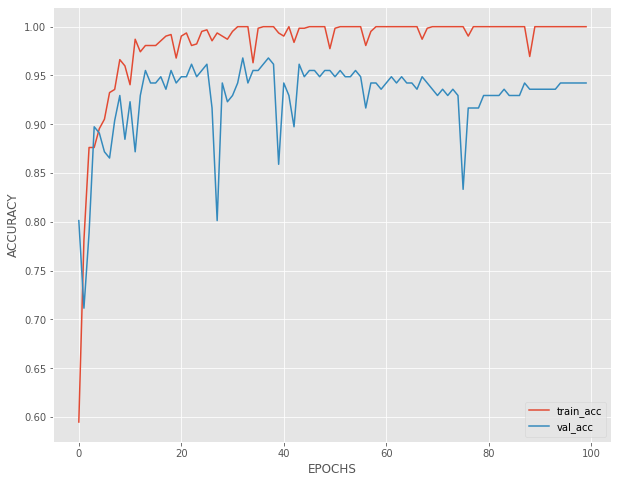

In [21]:
# plot the training and validation accuracy

plt.style.use('ggplot')
plt.figure(figsize=[10,8])
plt.plot(np.arange(0,100),Ani.history['accuracy'],label='train_acc')
plt.plot(np.arange(0,100),Ani.history['val_accuracy'],label='val_acc')
plt.xlabel("EPOCHS")
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

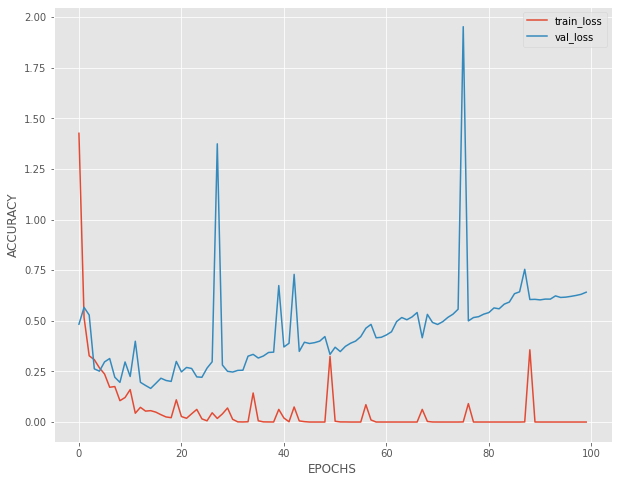

In [22]:
# plot the training and validation loss

plt.style.use('ggplot')
plt.figure(figsize=[10,8])
plt.plot(np.arange(0,100),Ani.history['loss'],label='train_loss')
plt.plot(np.arange(0,100),Ani.history['val_loss'],label='val_loss')
plt.xlabel("EPOCHS")
plt.ylabel("ACCURACY")
plt.legend()
plt.show()

In [23]:
# Evaluating the model
evaluation = model.evaluate(x_test, y_test)
print('TEST ACCURACY : {:.3F}'.format(evaluation[1]))

156/1 [=================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================================

In [24]:

#Predicting the model

pred=model.predict(x_test)
y_pred=[np.argmax(i) for i in pred]

In [25]:
y_pred[:5]

[1, 1, 2, 1, 1]

In [26]:
#Confusion Martix

def conf_mat(a,b,classes):
    con=confusion_matrix(a,b)
    conf=pd.DataFrame(data=con)
    sns.heatmap(data=conf,fmt='d',annot=True,cbar=False,annot_kws={'size':15},cmap=plt.cm.Blues,linewidths=0.2, linecolor='white' )
    plt.title("Confusion_matrix")
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks,classes,weight='bold')
    plt.yticks(tick_marks,classes)


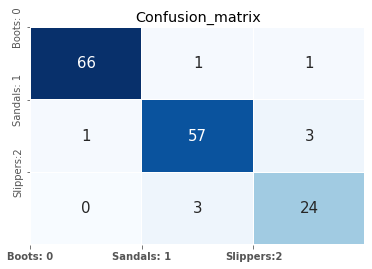

In [27]:
conf_mat(y_test,y_pred,classes=["Boots: 0","Sandals: 1","Slippers:2"])

In [28]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      0.97      0.98        68
           1       0.93      0.93      0.93        61
           2       0.86      0.89      0.87        27

    accuracy                           0.94       156
   macro avg       0.93      0.93      0.93       156
weighted avg       0.94      0.94      0.94       156



In [29]:
def display_img(img):
    fig = plt.figure(figsize=(8,8))
    plt.grid(b=None)
    ax = fig.add_subplot(111)
    ax.imshow(img)

[INFO] loading network and...


  0%|          | 0/89 [00:00<?, ?it/s]

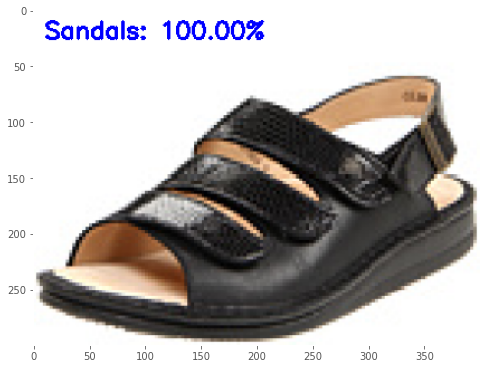

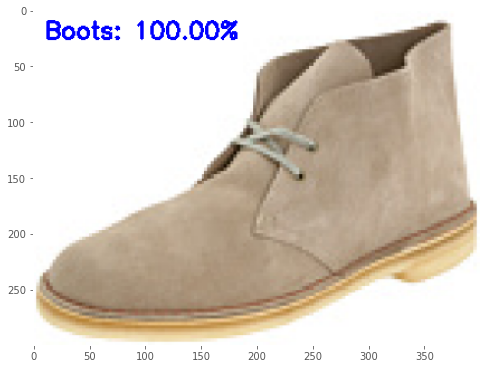

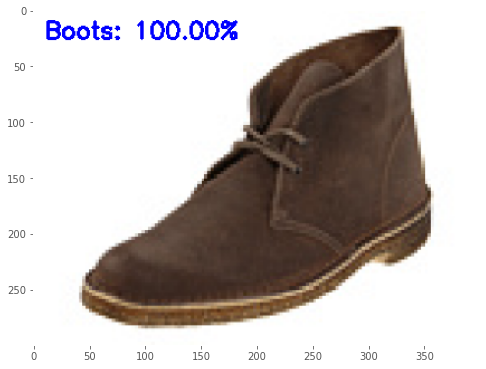

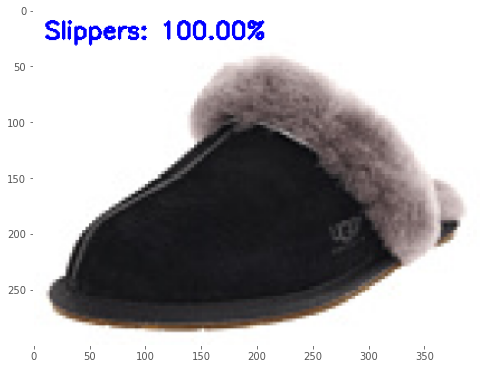

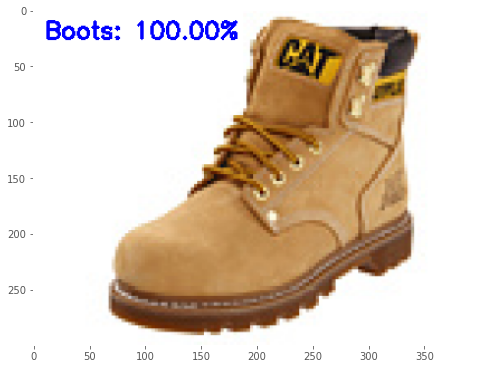

...

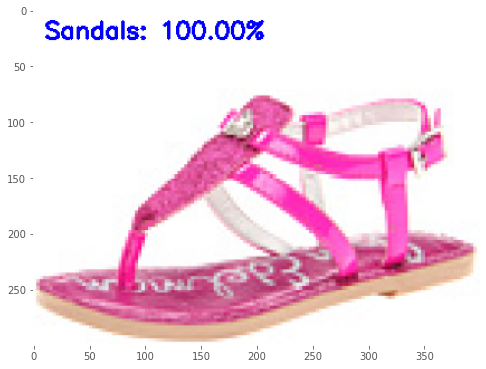

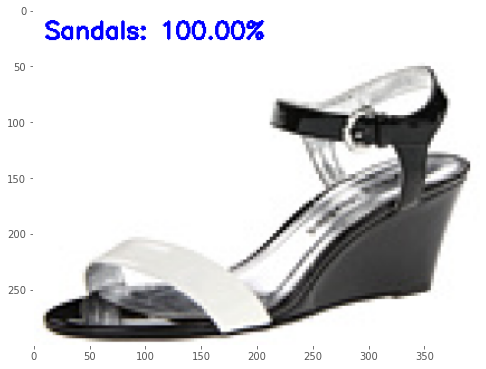

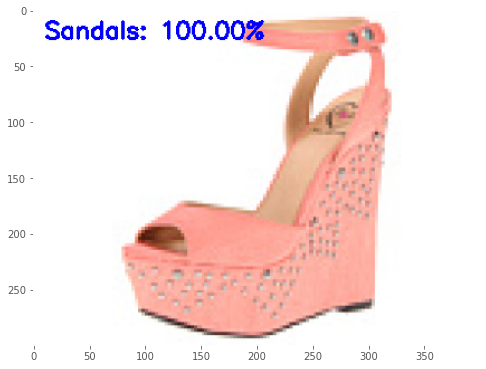

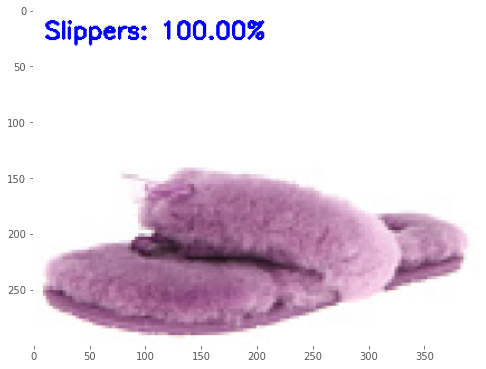

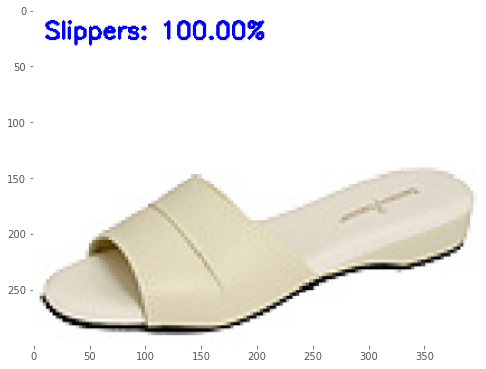

In [30]:

# # load the model 
print("[INFO] loading network and...")
# model = load_model(MODEL)

# grab the image paths and randomly shuffle themt
testImagePaths = sorted(list(paths.list_images('test')))   # data folder with 2 categorical folders

all_class = [ "Boots","Sandals","Slippers"]


# progress bar 
with tqdm(total=len(testImagePaths)) as pbar:
    
    for imagePath in testImagePaths:
        
        # load the image
        image = cv2.imread(imagePath)
        orig = image.copy()

        # pre-process the image for classification
        image = cv2.resize(image, (32, 32))
        image = image.astype("float") / 255.0
        image = img_to_array(image)
        image = np.expand_dims(image, axis=0)

        # classify the input image
        prd_conf = model.predict(image)[0]

        # build the label
        label = all_class[np.argmax(prd_conf)]
        proba = prd_conf[np.argmax(prd_conf)]

        label = "{}: {:.2f}%".format(label, proba * 100)

        # draw the label on the image
        output = imutils.resize(orig, width=400)
        cv2.putText(output, label, (10, 25),  cv2.FONT_HERSHEY_SIMPLEX,
            0.7, (255, 0, 0), 2)
        
        # convert img to rgb format and display in notebook
        img = cv2.cvtColor(output, cv2.COLOR_BGR2RGB)
        display_img(img)
        
        pbar.update(1)


### Gradio Function

In [31]:
#Intalling the Gradio.
!pip install gradio

     |████████████████████████████████| 656 kB 5.2 MB/s 
     |████████████████████████████████| 1.1 MB 46.0 MB/s 
     |████████████████████████████████| 2.0 MB 42.5 MB/s 
     |████████████████████████████████| 84 kB 2.9 MB/s 
     |████████████████████████████████| 210 kB 47.2 MB/s 
     |████████████████████████████████| 54 kB 2.3 MB/s 
     |████████████████████████████████| 255 kB 59.2 MB/s 
     |████████████████████████████████| 53 kB 2.1 MB/s 
     |████████████████████████████████| 271 kB 53.4 MB/s 
     |████████████████████████████████| 94 kB 3.8 MB/s 
     |████████████████████████████████| 144 kB 61.4 MB/s 
     |████████████████████████████████| 10.9 MB 30.7 MB/s 
     |████████████████████████████████| 58 kB 6.0 MB/s 
     |████████████████████████████████| 79 kB 8.3 MB/s 
     |████████████████████████████████| 43 kB 2.1 MB/s 
     |████████████████████████████████| 61 kB 499 kB/s 
     |████████████████████████████████| 3.6 MB 41.7 MB/s 
     |████████████████████████

In [32]:

#importing  the Libaray
import gradio as gr

In [33]:
def predict_image(image):
    # load the image
    
    # pre-process the image for classification
    image = cv2.resize(image, (32, 32))
    image = image.astype("float") / 255.0
    image = img_to_array(image)
    image = np.expand_dims(image, axis=0)

        
    preds = model.predict(image)[0]
    result = dict()
    result["Boots"] = round(float(list(preds)[0]), 3)
    result["Sandals"] = round(float(list(preds)[1]), 3)
    result["Slippers"] = round(float(list(preds)[2]), 3)
    
    print(result)
    
    return result

In [34]:

##Interface of Gradio
im = gr.inputs.Image(shape=(32,32))
label = gr.outputs.Label(num_top_classes=3)

gr.Interface(fn=predict_image, inputs=im, outputs=label, capture_session=True, title="CNN Demo").launch(share=True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://12966.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces (https://huggingface.co/spaces)


(<fastapi.applications.FastAPI at 0x7ffab6785750>,
 'http://127.0.0.1:7860/',
 'https://12966.gradio.app')

### The conclusion...


With 778 images, I was able to achieve 93% accuracy between Shoes,Boots and Chappal using a 2-layer convolutional network.

